<a href="https://colab.research.google.com/github/christianalvarezbaez/christianalvarezbaez.github.io/blob/main/Calling%20Customers%20Classifier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Introducción al notebook

Este notebook contiene el código, las figuras y los comentarios pertinentes a cada paso en el procedimiento desde la limpieza de datos hasta el diseño y evaluación de los modelos propuestos.



---
**Comentarios iniciales y recomendaciones**

La elección de resolver el problema planteado por medio de un notebook de google colab, fue la limitación de recursos computacionales disponibles. Para ejecutar el código, se empleó una cuenta **Pro de Google Colaboratory** que permite una memoria RAM de 25 gb. Se recomienda emplear una estación de trabajo acorde a estas especificaciones para poder ejecutar el código. Las figuras del código fueron almacenadas en diferentes links a los que se puede acceder también, si no desea ejecutar determinadas partes del código.



# Planteamiento del problema

Considera el archivo 20210513_Challenge_AA.csv. Este documento contiene información
sociodemográfica y transaccional sobre algunos clientes sobre los cuales se busca hacer una
clasificación de acuerdo a la bandera de la columna Target.

---


El problema del negocio a resolver se trata de un modelo de contactabilidad, se busca asociar
una probabilidad de contacto a cada cliente en función a ciertos segmentos horarios, a saber:
mañana, mediodía, tarde y noche. Este detalle se encuentra en la columna Horario.



In [ ]:
pip install pyspark


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 310.8/310.8 MB 3.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyspark: filename=pyspark-3.4.1-py2.py3-none-any.whl size=311285398 sha256=b883d8db6c81923392e724e37a75943530112bf0c58f1119c888c24ce23805b2
  Stored in directory: /root/.cache/pip/wheels/0d/77/a3/ff2f74cc9ab41f8f594dabf0579c2a7c6de920d584206e0834
Successfully built pyspark


In [ ]:
import pandas as pd
import numpy as np
import plotly.express as px
import sklearn
import pyspark
from pyspark.sql import SparkSession

#1. Cargar los datos


---


Puesto que los datos son de tamaño considerable, se optó por emplear Spark.

In [ ]:
#Creando sesión
spark = SparkSession.builder.appName("Challenge_1").config("spark.memory.offHeap.enabled","true").config("spark.memory.offHeap.size","10g").getOrCreate()

#Cargando datos
df = spark.read.options(header = True, delimiter = '|',).csv("/content/drive/MyDrive/COPPEL CHALLENGE/20210513_Challenge_AA.csv")
df.printSchema()
df.show()

root
 |-- ANIO: string (nullable = true)
 |-- MES: string (nullable = true)
 |-- CLIENTE: string (nullable = true)
 |-- ESTADO: string (nullable = true)
 |-- INGRESO: string (nullable = true)
 |-- MORAS: string (nullable = true)
 |-- SEXO: string (nullable = true)
 |-- ESTADOCIVIL: string (nullable = true)
 |-- FECHANACIMIENTO: string (nullable = true)
 |-- MARCACIONES: string (nullable = true)
 |-- CONTACTOS: string (nullable = true)
 |-- M1: string (nullable = true)
 |-- C1: string (nullable = true)
 |-- M2: string (nullable = true)
 |-- C2: string (nullable = true)
 |-- M3: string (nullable = true)
 |-- C3: string (nullable = true)
 |-- ANTIGUEDAD: string (nullable = true)
 |-- EDAD: string (nullable = true)
 |-- HORARIO: string (nullable = true)
 |-- TARGET: string (nullable = true)

+----+---+-------------+----------------+-------+-----+----+-----------+--------------------+-----------+---------+---+---+---+---+---+---+----------+----+--------+------+
|ANIO|MES|      CLIENTE|     

# 2. Filtrar los datos por horario seleccionado

---
 Se seleccionó el horario de medio día puesto que presenta mayor cantidad de datos de acuerdo a los queries realizados.


In [ ]:
df.createOrReplaceTempView("data")
spark.sql("SELECT HORARIO, COUNT(*) FROM data GROUP BY HORARIO ORDER BY COUNT(*) DESC").show()



+--------+--------+
| HORARIO|count(1)|
+--------+--------+
|MEDIODIA|10237457|
|   TARDE| 9828895|
|  MANANA| 9270223|
|   NOCHE| 8871786|
+--------+--------+



In [ ]:
df_= df.filter(df.HORARIO == 'NOCHE')

In [ ]:
df_= df_.sample(fraction = 0.005, seed= 101)

# 3. Indicar las dimensiones del nuevo fichero

In [ ]:
print("Número de filas: ", df_.count())
print("Número de columnas: ", len(df_.columns))
print ("Las variables y su descripción:")
df_.printSchema()


Número de filas:  43806
Número de columnas:  21
Las variables y su descripción:
root
 |-- ANIO: string (nullable = true)
 |-- MES: string (nullable = true)
 |-- CLIENTE: string (nullable = true)
 |-- ESTADO: string (nullable = true)
 |-- INGRESO: string (nullable = true)
 |-- MORAS: string (nullable = true)
 |-- SEXO: string (nullable = true)
 |-- ESTADOCIVIL: string (nullable = true)
 |-- FECHANACIMIENTO: string (nullable = true)
 |-- MARCACIONES: string (nullable = true)
 |-- CONTACTOS: string (nullable = true)
 |-- M1: string (nullable = true)
 |-- C1: string (nullable = true)
 |-- M2: string (nullable = true)
 |-- C2: string (nullable = true)
 |-- M3: string (nullable = true)
 |-- C3: string (nullable = true)
 |-- ANTIGUEDAD: string (nullable = true)
 |-- EDAD: string (nullable = true)
 |-- HORARIO: string (nullable = true)
 |-- TARGET: string (nullable = true)



# 4. Número de observaciones, valores perdidos, valores NA

**Limpieza de datos**

En esta sección se limpian los datos de la siguiente manera:

1. Se eliminan los carácteres de espacio
2. Se remplazan los valores vacíos con None
3. Se remueven los valores NaN

Además se muestran los datos requeridos por el punto 4 del Challenge.

**NOTA:** Los outliers serán removidos hasta después de realizar las primeras estadísticas e histogramas.

In [ ]:
from pyspark.sql.functions import isnan, when, count, col, trim
total_obs = df_.count()
print("Observaciones totales: ", total_obs)
print("Datos nulos por columna: ")
df_ = df_.select([trim(col(c)).alias(c) for c in df_.columns])           #Borrar espacios
df_=df_.select([when(col(c)=="",None).otherwise(col(c)).alias(c) for c in df_.columns]) #Remplazar valores vacíos con None
df_.select([count(when(isnan(c) | col(c).isNull(), c)).alias(c) for c in df.columns]).show() # Mostrar conteo de Nan
df_notnan = df_.na.drop("any")   #Remover Nan


len_df_notnan = df_notnan.count()

print("Nuevo número de observaciones válidas: ", len_df_notnan)
print("Observaciones retiradas: ", total_obs - len_df_notnan)
print("Porcentaje de datos retirados: ", (round(((total_obs - len_df_notnan)/total_obs)*100, 2)), "%")

ModuleNotFoundError: ignored

# 5. Expresar detalles estadísticos de los datos.


---



---




In [ ]:
#Se separan las variables numéricas de las categoricas
num_var = df_notnan.drop('CLIENTE','ESTADO','SEXO','ESTADOCIVIL','FECHANACIMIENTO','HORARIO','TARGET','ANIO','MES')
num_var_pd = num_var.toPandas()

In [ ]:
#separar los target
df_target = df_notnan.select('TARGET')
df_target = df_target.toPandas()

In [ ]:
summary = num_var_pd.astype(float).describe()
summary.index.names = ['Estadísticas']
summary.rename(index = {'count':'Observaciones','mean':'Promedio','stddev':'Desviación Estándar','min':'Mínimo', 'max':'Máximo'}, inplace = True)
summary

,INGRESO,MORAS,MARCACIONES,CONTACTOS,M1,C1,M2,C2,M3,C3,ANTIGUEDAD,EDAD
Estadísticas,,,,,,,,,,,,
Observaciones,4.301700e+04,43017.000000,43017.000000,43017.000000,43017.00000,43017.000000,43017.000000,43017.000000,43017.000000,43017.000000,43017.000000,43017.000000
Promedio,9.069843e+03,2.763373,54.718762,1.473673,38.88644,1.014111,28.827789,0.808215,21.751935,0.658554,1.302276,39.499802
std,8.650206e+03,2.130737,75.603682,3.322068,71.55208,2.993299,64.777578,2.649991,56.103490,2.316177,1.750611,13.358333
Mínimo,0.000000e+00,1.000000,1.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.000000
25%,6.000000e+03,1.000000,8.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,28.000000
50%,8.000000e+03,2.000000,28.000000,0.000000,7.00000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,38.000000
75%,1.100000e+04,4.000000,70.000000,2.000000,45.00000,1.000000,28.000000,0.000000,14.000000,0.000000,2.000000,49.000000
Máximo,1.000028e+06,23.000000,1672.000000,65.000000,1113.00000,70.000000,1952.000000,73.000000,1028.000000,59.000000,13.000000,89.000000


# 6. Programas para la generación de gráficas de las estadísticas generales de los datos

1. Gráficas para las estadísticas de los datos numéricos.

La figura interactiva también esta disponible en el siguiente [link](https://christianalvarezbaez.github.io/stats/)

In [ ]:
#plot
from plotly.subplots import make_subplots
import plotly.graph_objects as go

summary_P = summary.drop('Observaciones')

rows = int((len(num_var_pd.columns))/2)
cols = 2
fig = make_subplots(rows, cols)
j = 0


for col in range(1,cols+1):
  for row in range(1,rows+1):
      i = summary_P.columns[j]
      x = summary_P.index
      y = (summary_P[i].to_numpy()).astype(float)
      fig.add_trace((go.Scatter(x=x, y=y, name = i)), row=row, col=col)
      fig.update_layout(title = f'Estadísticas Generales')
      fig.update_layout(font=dict(
      family="Sans-serif, monospace",
        size=12,
        color="Black"), width=850, height=850).update_xaxes(tickfont_size=12).update_yaxes(tickfont_size=12)
      j = j+1
      fig.update_xaxes(title_text= i, titlefont_size=10,title_standoff= 0.1, row=row, col=col)

fig.show()



In [ ]:
import plotly.offline as pyo
pyo.plot(fig, filename="stats.html")

'stats.html'

**Histogramas**



---

Las siguientes gráficas se realizaron convirtiendo el RDD en un dataframe de pandas, dado que su menor tamaño permitía un desempeño más óptimo en Pandas que en Pyspark.

La figura interactiva también esta disponible en el siguiente [link](https://christianalvarezbaez.github.io/Histograms/)

In [ ]:
def plot_histograms(dfx,dft,title):

  rows = int((len(dfx.columns))/2)
  cols = 2
  fig = make_subplots(rows, cols)
  j = 0

  x = pd.DataFrame()
  x['TARGET'] = dft['TARGET']
  x[dfx.columns] = dfx[dfx.columns]
  x1 = x[x['TARGET'].astype(int) == 0]
  x2 = x[x['TARGET'].astype(int) == 1]

  for col in range(1,cols+1):
    for row in range(1,rows+1):
      i = dfx.columns[j]
      fig.add_trace(go.Histogram(x = x1[i].astype(float), name = '0', nbinsx = 20,marker_color='#73c4fa',opacity=0.75), row=row, col=col)
      fig.add_trace(go.Histogram(x = x2[i].astype(float), name = '1', nbinsx = 20,marker_color='#7afa5a',opacity=0.75),  row=row, col=col)
      fig.update_layout(title = str(title))
      fig.update_layout(font=dict(
      family="Sans-serif, monospace",
        size=12,
        color="Black"), width=850, height=850).update_xaxes(tickfont_size=12).update_yaxes(tickfont_size=12)
      j = j+1
      fig.update_xaxes(title_text= i, titlefont_size=10,title_standoff= 0.1, row=row, col=col)
      fig.update_yaxes(title_text= 'Frecuencia', titlefont_size=10, row=row, col=col)
      fig.update_layout(barmode='stack')
      fig.update_traces(showlegend = False)
      if i == dfx.columns[-1]:
        fig.update_traces(row=row, col=col,showlegend = True)
        fig.update_layout(legend_title_text='Target')
  return fig


In [ ]:
histograms = plot_histograms(num_var_pd,df_target,"Histogramas")

In [ ]:
histograms.show()

In [ ]:
#Guardando gráfica en archivo html

import plotly.offline as pyo
pyo.plot(histograms, filename="Histograms.html")

'Histograms.html'

**Box plots**

La figura interactiva también esta disponible en el siguiente [link](https://christianalvarezbaez.github.io/Boxplots/)

In [ ]:
def plot_boxes(dfx, title):
  rows = int((len(dfx.columns))/2)
  cols = 2
  fig = make_subplots(rows, cols)
  j = 0
  for col in range(1,cols+1):
    for row in range(1,rows+1):
      i = dfx.columns[j]
      fig.add_trace(go.Box(y=num_var_pd[i].astype(float),
            boxpoints='all',
            jitter=0.3,
            pointpos=-1.8, name = i
              ), row=row, col=col)
      fig.update_layout(title = str(title))
      fig.update_layout(font=dict(
      family="Sans-serif, monospace",
        size=12,
        color="Black"), width=850, height=1000).update_xaxes(tickfont_size=12).update_yaxes(tickfont_size=12)
      j = j+1
      fig.update_xaxes(titlefont_size=10,title_standoff= 0.1, row=row, col=col)
      fig.update_traces(showlegend = False)
  return fig


In [ ]:
box_plots = plot_boxes(num_var_pd,"Box plot")

In [ ]:
#Guardando gráfica en archivo html

import plotly.offline as pyo
pyo.plot(box_plots, filename="Boxplots.html")

'Boxplots.html'

**NOTA:** De acuerdo a las estadísticas del muestreo de los datos, la distribución de estos es claramente no normal, consecuencia de la existencia de outliers con valores extremos. Un ejemplo es en el caso de la variable de INGRESO en la cual la mayoría de los valores se encuentran dentro de los 25,000, sin embargo existen datos mayores a 1,000,000.

Para resolver esto, se removeran los datos por encima del percentil 95% en base a las variables de INGRESO y MARCACIONES Y M1, puesto que son las variables con mayor desviación estándar, además se volverán a ejecutar las celdas destinadas para la estadísitca descriptiva y los histogramas.

In [ ]:
q95_INGRESOS =num_var_pd['INGRESO'].astype(float).quantile(q=0.95) #Se calcula el percentil 95% de INGRESO
q95_MARCACIONES =num_var_pd['MARCACIONES'].astype(float).quantile(q=0.95) #Se calcula el percentil 95% de MARCACIONES
q95_M1 =num_var_pd['M1'].astype(float).quantile(q=0.95) #Se calcula el percentil 95% de M1

**Estadísticas sin outliers**

La figura interactiva también esta disponible en el siguiente [link](https://christianalvarezbaez.github.io/stats_NoOutliers/)

In [ ]:
df_notnan = df_notnan.filter((df_notnan.INGRESO <= q95_INGRESOS) & (df_notnan.MARCACIONES <= q95_MARCACIONES) &
                                         (df_notnan.M1 <= q95_M1))
num_var = df_notnan.drop('CLIENTE','ESTADO','SEXO','ESTADOCIVIL','FECHANACIMIENTO','HORARIO','TARGET','ANIO','MES')
num_var_pd = num_var.toPandas()
df_target = df_notnan.select('TARGET')
df_target = df_target.toPandas()

summary = num_var_pd.astype(float).describe()
summary.index.names = ['Estadísticas']
summary.rename(index = {'count':'Observaciones','mean':'Promedio','stddev':'Desviación Estándar','min':'Mínimo', 'max':'Máximo'}, inplace = True)
summary



,INGRESO,MORAS,MARCACIONES,CONTACTOS,M1,C1,M2,C2,M3,C3,ANTIGUEDAD,EDAD
Estadísticas,,,,,,,,,,,,
Observaciones,37942.000000,37942.000000,37942.000000,37942.000000,37942.000000,37942.000000,37942.000000,37942.000000,37942.000000,37942.000000,37942.000000,37942.000000
Promedio,8149.425040,2.720205,39.788809,1.461863,25.171815,0.937431,22.613041,0.750936,18.296452,0.608033,1.317774,39.429445
std,4327.441785,2.158048,43.150742,3.196689,39.038891,2.763846,49.409426,2.525870,47.883548,2.204657,1.758618,13.384183
Mínimo,0.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,18.000000
25%,5800.000000,1.000000,7.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,28.000000
50%,8000.000000,2.000000,24.000000,0.000000,5.000000,0.000000,1.000000,0.000000,0.000000,0.000000,1.000000,38.000000
75%,10000.000000,4.000000,57.000000,2.000000,36.000000,1.000000,22.000000,0.000000,11.000000,0.000000,2.000000,49.000000
Máximo,20000.000000,23.000000,200.000000,65.000000,181.000000,56.000000,941.000000,73.000000,1028.000000,44.000000,13.000000,89.000000


In [ ]:
summary_P = summary.drop('Observaciones')

rows = int((len(num_var_pd.columns))/2)
cols = 2
fig = make_subplots(rows, cols)
j = 0


for col in range(1,cols+1):
  for row in range(1,rows+1):
      i = summary_P.columns[j]
      x = summary_P.index
      y = (summary_P[i].to_numpy()).astype(float)
      fig.add_trace((go.Scatter(x=x, y=y, name = i)), row=row, col=col)
      fig.update_layout(title = f'Estadísticas Generales sin Outliers')
      fig.update_layout(font=dict(
      family="Sans-serif, monospace",
        size=12,
        color="Black"), width=850, height=850).update_xaxes(tickfont_size=12).update_yaxes(tickfont_size=12)
      j = j+1
      fig.update_xaxes(title_text= i, titlefont_size=10,title_standoff= 0.1, row=row, col=col)

fig.show()


In [ ]:
#Guardando gráfica en archivo html

import plotly.offline as pyo
pyo.plot(fig, filename="stats_noOutliers.html")

'stats_noOutliers.html'

**Histogramas sin outliers**

La figura interactiva también esta disponible en el siguiente [link](https://christianalvarezbaez.github.io/Histograms_noOutliers/
)

In [ ]:
histograms = plot_histograms(num_var_pd,df_target,"Histogramas sin Outliers")
histograms.show()

In [ ]:
#Guardando gráfica en archivo html

import plotly.offline as pyo
pyo.plot(histograms, filename="Histograms_NoOutliers.html")

'Histograms_NoOutliers.html'

**Box plots sin outliers**

La figura interactiva también esta disponible en el siguiente [link](https://christianalvarezbaez.github.io/Boxplots_noOutliers/)

In [ ]:
box_plots = plot_boxes(num_var_pd,"Box plots sin Outliers")
box_plots.show()

In [ ]:
#Guardando gráfica en archivo html

import plotly.offline as pyo
pyo.plot(box_plots, filename="Boxplots_NoOutliers.html")

'Boxplots_NoOutliers.html'

**Nuevas dimensiones del fichero**

Remover los outliers deja una muestra de datos con nuevas dimensiones:

In [ ]:
sample_dirty = df_.count()
sample_clean = df_notnan.count()

print("Observaciones del set de datos sucios: ", sample_dirty)
print("Observaciones del nuevo set de datos limpios: ", sample_clean)
print("Porcentaje de datos removidos: ", round((((sample_dirty - sample_clean)/sample_dirty)*100),2), '%')

Observaciones del nuevo set de datos sucios:  43806
Observaciones del nuevo set de datos limpios:  37942
Porcentaje de datos removidos:  13.39 %


**Tests de normalidad**

---
A simple vista se observa que ninguno de los datos no estan distribuidos normalmente, sin embargo es posible realizar tests de normalidad basados en los métodos de Shapiro-Wilk y de D'Angostino K2 para tener evidencia cuantitativa.

Estos tests se realizan con una muestra de datos < 5000, por lo que se realizó un muestreo.


**Shapiro-Wilk**

In [ ]:
import scipy
from scipy.stats import shapiro
alpha = 0.05

test_results = pd.DataFrame({'Variable': pd.Series(dtype='str'),'Valor p': pd.Series(dtype='float'),
                   'Distribución': pd.Series(dtype='str')})

sample = num_var_pd.sample(5000)

for i in sample:
  testdata = sample[f'{i}'].astype(float)
  stat, p = shapiro(testdata)

 # print( 'stat=%.2f, p=%.30f' % (stat, p))
  if p > alpha:
    c = "Normal"
  elif p < alpha:
    c = "No normal"
  lista = [i,p,c]
  test_results.loc[len(test_results)] = lista

test_results

,Variable,Valor p,Distribución
0,INGRESO,4.042955e-34,No normal
1,MORAS,0.000000e+00,No normal
2,MARCACIONES,0.000000e+00,No normal
3,CONTACTOS,0.000000e+00,No normal
4,M1,0.000000e+00,No normal
5,C1,0.000000e+00,No normal
6,M2,0.000000e+00,No normal
7,C2,0.000000e+00,No normal
8,M3,0.000000e+00,No normal
9,C3,0.000000e+00,No normal


**D'Angostino K2**

In [ ]:
import scipy
from scipy.stats import normaltest
alpha = 0.05

test_results = pd.DataFrame({'Variable': pd.Series(dtype='str'),'Valor p': pd.Series(dtype='float'),
                   'Distribución': pd.Series(dtype='str')})

for i in sample:
  testdata = sample[f'{i}'].astype(float)
  stat, p = normaltest(testdata)

 # print( 'stat=%.2f, p=%.30f' % (stat, p))
  if p > alpha:
    c = "Normal"
  elif p < alpha:
    c = "No normal"
  lista = [i,p,c]
  test_results.loc[len(test_results)] = lista

test_results

,Variable,Valor p,Distribución
0,INGRESO,1.817678e-44,No normal
1,MORAS,1.403386e-211,No normal
2,MARCACIONES,5.694279e-290,No normal
3,CONTACTOS,0.000000e+00,No normal
4,M1,0.000000e+00,No normal
5,C1,0.000000e+00,No normal
6,M2,0.000000e+00,No normal
7,C2,0.000000e+00,No normal
8,M3,0.000000e+00,No normal
9,C3,0.000000e+00,No normal


# 6.1 Conclusiones del paso 6

* De acuerdo a la examinación de las variables numéricas, existían datos extremos en algunas variables que podrían complicar la modelación, por lo que fueron removidos los puntos de dato superiores al percentil 95%.

* La mayoría de los datos no están distribuidos normalmente de acuerdo a dos tests de normalidad (Sahpiro y D'Angostino K2).

# 7. Programa para crear un gráfico de barras de la frecuencia en las variables categóricas

**Limpieza, selección y modificación de variables categóricas**


---

La figura interactiva también esta disponible en el siguiente [link](https://christianalvarezbaez.github.io/Categories_Frequencies/)


In [ ]:

cat_var = df_notnan.select('SEXO','ESTADOCIVIL','ESTADO','MES')
cat_var_pd = cat_var.toPandas()
dict1 = {'1' : 'Enero', '2' : 'Febrero', '3': 'Marzo', '4' : 'Abril', '5': 'Mayo', '6': 'Junio', '7' : 'Julio',
'8' : 'Agosto', '9' : 'Septiembre', '10': 'Octubre', '11': 'Noviembre', '12': 'Diciembre'}

dict2 = {'M':'Masculino','F':'Femenino'}

dict3 = {'S':'Soltero/a','C':'Casado/a', 'U':'Unión Libre', 'V':'Viudo/a', 'D':'Divorciado/a'}

cat_var_pd=cat_var_pd.replace({"MES": dict1, 'SEXO':dict2, 'ESTADOCIVIL': dict3})

In [ ]:
def plot_bars(dfx,dft,title):

  rows = int((len(dfx.columns))/2)
  cols = 2
  fig = make_subplots(rows, cols)
  j = 0

  x = pd.DataFrame()
  x['TARGET'] = dft['TARGET']
  x[dfx.columns] = dfx[dfx.columns]
  x1 = x[x['TARGET'].astype(int) == 0]
  x2 = x[x['TARGET'].astype(int) == 1]

  for col in range(1,cols+1):
    for row in range(1,rows+1):
      i = dfx.columns[j]
      fig.add_trace(go.Histogram(x = x1[i].astype(str), name = '0', nbinsx = 20,marker_color='#73c4fa',opacity=0.75), row=row, col=col)
      fig.add_trace(go.Histogram(x = x2[i].astype(str), name = '1', nbinsx = 20,marker_color='#7afa5a',opacity=0.75),  row=row, col=col)
      fig.update_layout(title = str(title))
      fig.update_layout(font=dict(
      family="Sans-serif, monospace",
        size=12,
        color="Black"), width=1200, height=850)
      j = j+1
      fig.update_xaxes(title_text= i, titlefont_size=12,title_standoff= 0.1, row=row, col=col)
      fig.update_yaxes(title_text= 'Frecuencia', titlefont_size=12, row=row, col=col)
      fig.update_layout(barmode='stack')
      fig.update_traces(showlegend = False)
      if i == dfx.columns[-1]:
        fig.update_traces(row=row, col=col,showlegend = True)
        fig.update_layout(legend_title_text='Target')
  return fig


In [ ]:
figura = plot_bars(cat_var_pd,df_target,'Frecuencia de variables categóricas')

In [ ]:
figura.update_traces(x=[x[:7] for x in cat_var_pd['ESTADO']], col = 2, row = 1)

In [ ]:
import plotly.offline as pyo
pyo.plot(figura, filename="Categories_Frequencies_NoOutliers.html")

'Categories_Frequencies_NoOutliers.html'

# 8. Análisis de correlaciones entre variables



---
Para realizar esto, primero se empleará los métodos de Pearson y Spearman en el caso de las variables numéricas y se aplicará testing de hipótesis para verificar la significancia estadística.

Lo segundo será emplear el método de Chi cuadrado y también se aplicará testing de hipótesis.


# 8.1 Evaluación de correlación entre variables numéricas

**1. Correlaciones de las variables con el método de Pearson**

La figura interactiva también esta disponible en el siguiente [link](https://christianalvarezbaez.github.io/PearsonMatrix/)

In [ ]:
test = num_var_pd.astype(float).corr(method = 'pearson')
fig = px.imshow(test)
fig.update_layout(title= 'Matriz de correlación de Pearson', title_x = 0.5)
fig.show()

test1 = test.abs()
a = test1.unstack()
ao = pd.DataFrame(a.sort_values(kind="quicksort"))
top = ao[ao[0] != 1.0].sort_values(by = 0,ascending = False).head(40)
print ("Las 20 parejas con mayor correlación de acuerdo a Pearson")
top.rename(columns = {0:'Correlación de Pearson'}, inplace = True)
top = top.iloc[::2]
top



Las 40 parejas con mayor correlación de acuerdo a Pearson


Correlación de Pearson
C1          CONTACTOS                  0.550547
C2          C1                         0.531549
            C3                         0.514314
M3          M2                         0.489316
M2          M1                         0.486905
M1          MARCACIONES                0.428496
C1          C3                         0.401988
MORAS       M1                         0.388202
CONTACTOS   C2                         0.382318
            C3                         0.333594
M2          MORAS                      0.326778
MORAS       M3                         0.305135
M3          M1                         0.297730
M2          MARCACIONES                0.245254
M3          C3                         0.235315
MORAS       MARCACIONES                0.222073
M1          C1                         0.219189
C2          M2                         0.210809
MARCACIONES M3                         0.183055
C2          M1                         0.161242

In [ ]:
import plotly.offline as pyo
pyo.plot(fig, filename="PearsonMatrix.html")

'PearsonMatrix.html'

In [ ]:
from scipy.stats import pearsonr
alpha = 0.05

H = test_results = pd.DataFrame({'Valor p': pd.Series(dtype='float'),
                   'Relación': pd.Series(dtype='str')})

for i in range(0,len(top)):
  stat, p = pearsonr(num_var_pd[top.index[i][0]].astype(float),num_var_pd[top.index[i][1]].astype(float))
  if p > alpha:
    c = 'Variables independientes'
  elif p < alpha:
    c = 'Variables dependientes'
  lista = [p,c]
  H.loc[len(H)] = lista

top.reset_index(inplace = True)
H.reset_index(inplace = True)
top['Valor p'] = H['Valor p']
top['Relación'] = H['Relación']
top.rename(columns = {'level_0':'Variable 1', 'level_1': 'Variable 2'}, inplace = True)
print("Correlaciones de Pearson y el veredícto del Hypothesis Testing")
top_pearson = top
top_pearson


Correlaciones de Pearson y el veredícto del Hypothesis Testing


,Variable 1,Variable 2,Correlación de Pearson,Valor p,Relación
0,C1,CONTACTOS,0.550547,0.000000e+00,Variables dependientes
1,C2,C1,0.531549,0.000000e+00,Variables dependientes
2,C2,C3,0.514314,0.000000e+00,Variables dependientes
3,M3,M2,0.489316,0.000000e+00,Variables dependientes
4,M2,M1,0.486905,0.000000e+00,Variables dependientes
5,M1,MARCACIONES,0.428496,0.000000e+00,Variables dependientes
6,C1,C3,0.401988,0.000000e+00,Variables dependientes
7,MORAS,M1,0.388202,0.000000e+00,Variables dependientes
8,CONTACTOS,C2,0.382318,0.000000e+00,Variables dependientes
9,CONTACTOS,C3,0.333594,0.000000e+00,Variables dependientes


**2. Correlaciones de las Variables con el método Spearman**

La figura interactiva también esta disponible en el siguiente [link](https://christianalvarezbaez.github.io/SpearmanMatrix/)

In [ ]:
test = num_var_pd.astype(float).corr(method = 'spearman')
fig = px.imshow(test)
fig.update_layout(title = 'Matriz de correlación Spearman', title_x = 0.5)
fig.show()
test1 = test.abs()
a = test1.unstack()
ao = pd.DataFrame(a.sort_values(kind="quicksort"))
top = ao[ao[0] != 1.0].sort_values(by = 0,ascending = False).head(40)
print ("Las 20 parejas con mayor correlación de acuerdo a Spearman")
top.rename(columns = {0:'Correlación de Spearman'}, inplace = True)
top = top.iloc[::2]
top



Las 40 parejas con mayor correlación de acuerdo a Spearman


,,Correlación de Spearman
M3,M2,0.612364
M2,M1,0.580753
MORAS,M1,0.555477
M3,C3,0.531999
MORAS,M2,0.485357
MARCACIONES,M1,0.483016
C2,M2,0.461653
CONTACTOS,C1,0.447137
C3,C2,0.444225
C1,C2,0.435805


In [ ]:
import plotly.offline as pyo
pyo.plot(fig, filename="SpearmanMatrix.html")

'SpearmanMatrix.html'

In [ ]:
from scipy.stats import spearmanr
alpha = 0.05

H = test_results = pd.DataFrame({'Valor p': pd.Series(dtype='float'),
                   'Relación': pd.Series(dtype='str')})

for i in range(0,len(top)):
  stat, p = spearmanr(num_var_pd[top.index[i][0]].astype(float),num_var_pd[top.index[i][1]].astype(float))
  if p > alpha:
    c = 'Variables independientes'
  elif p < alpha:
    c = 'Variables dependientes'
  lista = [p,c]
  H.loc[len(H)] = lista

top.reset_index(inplace = True)
H.reset_index(inplace = True)
top['Valor p'] = H['Valor p']
top['Relación'] = H['Relación']
top.rename(columns = {'level_0':'Variable 1', 'level_1': 'Variable 2'}, inplace = True)
print("Correlaciones de Spearman y el veredícto del Hypothesis Testing")
top_spearman = top
top_spearman

Correlaciones de Spearman y el veredícto del Hypothesis Testing


,Variable 1,Variable 2,Correlación de Spearman,Valor p,Relación
0,M3,M2,0.612364,0.0,Variables dependientes
1,M2,M1,0.580753,0.0,Variables dependientes
2,MORAS,M1,0.555477,0.0,Variables dependientes
3,M3,C3,0.531999,0.0,Variables dependientes
4,MORAS,M2,0.485357,0.0,Variables dependientes
5,MARCACIONES,M1,0.483016,0.0,Variables dependientes
6,C2,M2,0.461653,0.0,Variables dependientes
7,CONTACTOS,C1,0.447137,0.0,Variables dependientes
8,C3,C2,0.444225,0.0,Variables dependientes
9,C1,C2,0.435805,0.0,Variables dependientes


In [ ]:
print("Parejas de variables donde coincide la aparición en ambos métodos de correlación")


top_spearman.iloc[np.where((top_pearson['Variable 1'] == top_pearson['Variable 1']) | (top_pearson['Variable 2'] == top_pearson['Variable 2']))]

Parejas de variables donde coincide la aparición en ambos métodos de correlación


,Variable 1,Variable 2,Correlación de Spearman,Valor p,Relación
0,M3,M2,0.612364,0.0,Variables dependientes
1,M2,M1,0.580753,0.0,Variables dependientes
2,MORAS,M1,0.555477,0.0,Variables dependientes
3,M3,C3,0.531999,0.0,Variables dependientes
4,MORAS,M2,0.485357,0.0,Variables dependientes
5,MARCACIONES,M1,0.483016,0.0,Variables dependientes
6,C2,M2,0.461653,0.0,Variables dependientes
7,CONTACTOS,C1,0.447137,0.0,Variables dependientes
8,C3,C2,0.444225,0.0,Variables dependientes
9,C1,C2,0.435805,0.0,Variables dependientes


In [ ]:
def f(df):
    if ((df >= 0.0) and (df <= 0.25)):
        val = 'Baja correlación'
    elif ((df > 0.25) and (df <= 0.50)):
        val = 'Moderada correlación'
    else:
        val = "Alta correlación"
    return val

df = top_spearman['Correlación de Spearman'].astype(float)
top_spearman['Nivel de correlación'] = df.apply(f)
top_spearman


,Variable 1,Variable 2,Correlación de Spearman,Valor p,Relación,Nivel de correlación
0,M3,M2,0.612364,0.0,Variables dependientes,Alta correlación
1,M2,M1,0.580753,0.0,Variables dependientes,Alta correlación
2,MORAS,M1,0.555477,0.0,Variables dependientes,Alta correlación
3,M3,C3,0.531999,0.0,Variables dependientes,Alta correlación
4,MORAS,M2,0.485357,0.0,Variables dependientes,Moderada correlación
5,MARCACIONES,M1,0.483016,0.0,Variables dependientes,Moderada correlación
6,C2,M2,0.461653,0.0,Variables dependientes,Moderada correlación
7,CONTACTOS,C1,0.447137,0.0,Variables dependientes,Moderada correlación
8,C3,C2,0.444225,0.0,Variables dependientes,Moderada correlación
9,C1,C2,0.435805,0.0,Variables dependientes,Moderada correlación


# 8.1.1 Conclusiones de la evaluación de correlación entre variables numéricas

---

* Se encontraron 20 combinaciones de variables con un rango de valor de correlación entre 0.25 y 0.60 de acuerdo al método de Spearman.

* Tanto el método de Spearman como el de Pearson coinciden en 19 de las 20 parejas de variables con mayor correlación, y aunque el orden de estas no coincida plenamente, ambos métodos confirman estas 19 parejas de variables como las más correlacionadas.

* Se les fue aplicada un hypothesis testing a cada una de las parejas de variables del top 20 para evaluar su significancia estadística.

* De acuerdo al criterio establecido los rangos de correlación (0.0 - 0.25 Baja correlación, 0.25 - 0.50 Moderada correlación, 0.50 - 1 Alta correlación), se identificaron pares de variables con alta y moderada correlación.

# 8.2 Evaluación de correlación entre variables categóricas

**1. Correlación de las variables categóricas empleando el método Chi cuadrado.**



In [ ]:
from scipy.stats import chi2_contingency
alpha = 0.05

chi2_results = pd.DataFrame({'Variable 1': pd.Series(dtype='string'), 'Variable 2': pd.Series(dtype='string'),
                             'Valor p': pd.Series(dtype='float'), 'Relación': pd.Series(dtype='str')})

for i in cat_var_pd.columns:
  for j in cat_var_pd.columns:
    if i != j and len(chi2_results[chi2_results['Variable 1'] == j]) < 1:
      contingency_table = pd.crosstab(cat_var_pd[i],cat_var_pd[j], margins = False)
      stats, pi, dof, expected = chi2_contingency(contingency_table)
      if p > alpha:
        c = "Variables no relacionadas"
      else:
        c = "Variables relacionadas"
      lista = [i,j,f'{p:.30f}',c]
      chi2_results.loc[len(chi2_results)] = lista
    else:
      continue

chi2_results

,Variable 1,Variable 2,Valor p,Relación
0,SEXO,ESTADOCIVIL,0.000000000000000000000000000000,Variables relacionadas
1,SEXO,ESTADO,0.000000000000000000000000000000,Variables relacionadas
2,SEXO,MES,0.000000000000000000000000000000,Variables relacionadas
3,ESTADOCIVIL,ESTADO,0.000000000000000000000000000000,Variables relacionadas
4,ESTADOCIVIL,MES,0.000000000000000000000000000000,Variables relacionadas
5,ESTADO,MES,0.000000000000000000000000000000,Variables relacionadas


#8.2.1 Conclusiones de la evaluación de correlación entre las variables categóricas

* De acuerdo a los tests de chi cuadrada, las variables categóricas de los datos tienen cambios de frecuencia suficientes entre ellas para considerar que están relacionadas.

# 8.3 Evaluación de correlación entre las variables categóricas y numéricas.

Una forma de evaluar los cambios o respuestas entre las variables categóricas y las variables numéricas es empleando el análisis de varianza o **ANOVA**, el cual se empleó entre las variables.

In [ ]:
#Dejar unicamente las variables categoricas con más de 2 clases
cat_var_pd_3 = pd.DataFrame()
for i in cat_var_pd:
  if len(pd.unique(cat_var_pd[i])) > 2:
    cat_var_pd_3[i] = cat_var_pd[i]
  else:
    continue
cat_var_pd_3

,ESTADOCIVIL,ESTADO,MES
0,Soltero/a,GUANAJUATO,Mayo
1,Soltero/a,SONORA,Mayo
2,Soltero/a,GUANAJUATO,Mayo
3,Unión Libre,VERACRUZ,Mayo
4,Soltero/a,HIDALGO,Mayo
...,...,...,...
37937,Unión Libre,NAYARIT,Marzo
37938,Casado/a,JALISCO,Abril
37939,Soltero/a,CHIHUAHUA,Abril
37940,Divorciado/a,VERACRUZ,Abril


In [ ]:
from scipy.stats import f_oneway

anova_results = pd.DataFrame({'Variable 1': pd.Series(dtype='string'), 'Variable 2': pd.Series(dtype='string'),
                             'Valor p': pd.Series(dtype='float'), 'Relación': pd.Series(dtype='str')})

alpha = 0.05
for i in num_var_pd.columns:
  for j in cat_var_pd_3.columns:
    classes = pd.unique(cat_var_pd[j].values)
    l_data = [num_var_pd[i][cat_var_pd_3[j] == clas] for clas in classes]
    f, p = f_oneway(*l_data)
    if p > 0.05:
      c = 'No existe varianza entre los grupos'
    else:
      c = 'Existe varianza entre los grupos'

    lista = [i,j,f'{p:.30f}',c]
    anova_results.loc[len(anova_results)] = lista

anova_results.sort_values(by = 'Valor p')


,Variable 1,Variable 2,Valor p,Relación
17,C1,MES,0.000000000000000000000000000000,Existe varianza entre los grupos
34,EDAD,ESTADO,0.000000000000000000000000000000,Existe varianza entre los grupos
16,C1,ESTADO,0.000000000000000000000000000000,Existe varianza entre los grupos
23,C2,MES,0.000000000000000000000000000000,Existe varianza entre los grupos
14,M1,MES,0.000000000000000000000000000000,Existe varianza entre los grupos
26,M3,MES,0.000000000000000000000000000000,Existe varianza entre los grupos
11,CONTACTOS,MES,0.000000000000000000000000000000,Existe varianza entre los grupos
10,CONTACTOS,ESTADO,0.000000000000000000000000000000,Existe varianza entre los grupos
29,C3,MES,0.000000000000000000000000000000,Existe varianza entre los grupos
30,ANTIGUEDAD,ESTADOCIVIL,0.000000000000000000000000000000,Existe varianza entre los grupos


#8.3.1 Conclusiones de la evaluación de correlación entre las variables categóricas y numéricas

* De acuerdo a los tests de ANOVA aplicados, 28 de las 36 combinaciones de las variables presentan varianza entre sus grupos, lo que indíca una respuesta correlacionada en cierta medida entre ambas variables.

**NOTA:** Dado que el método ANOVA se emplea para variables 3 grupos o más, se removió la variable de sexo.

# 9. Establecer un criterio para determinar aquellos factores de mayor influencia respecto al target.

Para realizar esto se empleó la librería **optbinning** la cual permite realizar una división de bines óptimos entre las variables numéricas en función del target. Esto con el objetivo de calcular el **weight of evidence** y la **information value** de cada una. La función **binning_table** despliega los resultados de estos cálculos en una gráfica y un dataframe.

In [ ]:
!pip install optbinning --upgrade

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 kB 8.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.4/16.4 MB 46.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 304.5/304.5 kB 30.0 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 3.20.3
    Uninstalling protobuf-3.20.3:
      Successfully uninstalled protobuf-3.20.3


**Construcción de función para calcular los WoE y los IV de cada variable numérica, además de devolver un panel de gráficas de cada variable, un dataframe con las variables ordenadas en funcion de su IV y el modelo para el split de cada variable si se desea convertir la variable en una categórica.**



In [ ]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from optbinning import OptimalBinning



#dtype puede ser numerical o categorical
#solver cp para variables numéricas, mpi para variables categóricas
def woe_plots(dfx,dfy,dtype,solver):
  y = y = dfy['TARGET'].astype(int)
  IV = pd.DataFrame({'Variable': pd.Series(dtype='str'),
                   'Information Value': pd.Series(dtype='float'),
                     'Poder de predicción': pd.Series(dtype='str')})
  rows = int((len(dfx.columns))/2)
  cols = 2
  specs = [[{"secondary_y": True},{"secondary_y": True}]]*rows
  fig_panel = make_subplots(rows=rows, cols=cols,
                            specs=specs,
                            subplot_titles=([str(v) for v in (list(range(0, len(dfx.columns))))]))
  woe = []
  j = 0
  for row in range(1,rows+1):
    for col in range(1,cols+1):
      i = dfx.columns[j]
      if dtype == 'numerical':
        X = dfx[i].astype(float)
      else:
        X = dfx[i].astype(str)
      optb = OptimalBinning(name=i, dtype=str(dtype), solver = str(solver))
      optb.fit(X, y)
      woe.append([])
      woe[j] = optb
      woe_df = pd.DataFrame(optb.binning_table.build())
      iv = woe_df['IV']['Totals']
      if iv <= 0.02:
        pp = 'No es útil'
      elif (iv > 0.02) & (iv <= 0.1):
        pp = 'Bajo'
      elif (iv > 0.1) & (iv <= 0.3):
        pp = 'Medio'
      elif (iv > 0.03) & (iv <= 0.5):
        pp = 'Fuerte'
      else:
        pp = 'posible fuga'
      lista = [i, iv, pp]
      IV.loc[len(IV)] = lista
      woe_df = woe_df[:-3]
      x = list(woe_df.index)
#      x = x[:-1]
      x = [str(x) for x in x]

      fig_panel.add_trace(go.Bar(name='Target 0', x=x, y=woe_df['Non-event'],marker_color='#73c4fa',opacity=0.75), row = row, col = col)
      fig_panel.add_trace(go.Bar(name='Target 1', x=x, y=woe_df['Event'], marker_color='#7afa5a',opacity=0.75, ),  row = row, col = col)
      fig_panel.add_trace(go.Scatter(name = 'WoE', x=x, y=woe_df['WoE'], marker_color='#000000'), row = row, col = col, secondary_y=True)
      fig_panel.update_layout(barmode='stack')
      fig_panel.update_xaxes(title_text= f'<b> BINS DE {i}<b>', titlefont_size=12,title_standoff= 0.1, row=row, col=col)
      fig_panel.update_yaxes(title_text= '<b>Frecuencia </b>', titlefont_size=12, row=row, col=col)
      fig_panel.update_yaxes(title_text="<b> WoE</b> ", secondary_y=True)
      fig_panel.update_layout(title = 'Weight of Evidence and Information Value',  width=850, height=1000)
      fig_panel.layout.annotations[j].update(text=f'IV: {round(iv,3)}')
      fig_panel.update_traces(showlegend = False)
      j = j+1
      if i == dfx.columns[-1]:
        fig_panel.update_traces(row=row, col=col,showlegend = True)
        IV.sort_values(by='Information Value', ascending = False, inplace = True)

  return fig_panel, IV, woe

(CVXPY) Jun 15 04:18:20 PM: Encountered unexpected exception importing solver GLOP:
RuntimeError('Unrecognized new version of ortools (9.6.2534). Expected < 9.5.0.Please open a feature request on cvxpy to enable support for this version.')
(CVXPY) Jun 15 04:18:20 PM: Encountered unexpected exception importing solver PDLP:
RuntimeError('Unrecognized new version of ortools (9.6.2534). Expected < 9.5.0.Please open a feature request on cvxpy to enable support for this version.')


In [ ]:
woe_numerical = woe_plots(num_var_pd, df_target, dtype = 'numerical', solver = 'cp')

**Gráficas de los WoE y IV de cada variable**

La figura interactiva también esta disponible en el siguiente [link](https://christianalvarezbaez.github.io/WOEnumerical/)

In [ ]:
woe_numerical[0].show()

In [ ]:
import plotly.offline as pyo
pyo.plot(woe_numerical[0], filename="WOEnumerical.html")

'WOEnumerical.html'

**IV de todas las variables numéricas**

In [ ]:
woe_numerical_df = woe_numerical[1]
woe_numerical_df

NameError: ignored

**Aplicación de la misma función para el cálculo de WoE y el IV de las variables categóricas**

La figura interactiva también esta disponible en el siguiente [link](https://christianalvarezbaez.github.io/WOEcategorical/)

In [ ]:
woe_categorical= woe_plots(cat_var_pd,df_target,dtype = 'categorical', solver = 'mip')

In [ ]:
woe_categorical[0].show()

In [ ]:
import plotly.offline as pyo
pyo.plot(woe_categorical[0], filename="WOEcategorical.html")

'WOEcategorical.html'

In [ ]:
woe_categorical_df = woe_categorical[1]

**Tabla final con los resultados de todas las variables**

In [ ]:
Final_woe = [woe_categorical_df, woe_numerical_df]
Final_woe = pd.concat(Final_woe).sort_values(by = 'Information Value', ascending = False)
Final_woe

,Variable,Information Value,Poder de predicción
3,CONTACTOS,1.921399,posible fuga
5,C1,0.462098,Fuerte
7,C2,0.256840,Medio
9,C3,0.182701,Medio
2,MARCACIONES,0.131494,Medio
1,MORAS,0.090792,Bajo
4,M1,0.072876,Bajo
6,M2,0.072002,Bajo
8,M3,0.043717,Bajo
3,MES,0.040851,Bajo


#9.1 Conclusiones sobre el WoE y el IV

* Los resultados indican que existen una 3 variables con muy poca utilidad (Edad, estado civil y sexo), mientras que se encontraron 3 variables con un poder de predicción medio (C2, C3 y marcaciones), una con un un poder de predicción fuerte (C1) y una que se clasificaría como fuga de información (Contactos), aunque es de esperarse que el número de contactos esté muy relacionado con la probabilidad de que una persona responda a la llamada.



#10. Elaboración de nuevas variables

Con base en los resultados de la exploración de las variables y su evaluación, se propone la construcción de nuevas variables.

---

* Para el propósito de que los modelos construidos no sean propensos al overfitting y sean demasiado sensibles a los cambios de las variables numéricas, se categorizaran algunas de estas variables de acuerdo a los bins óptimos determinados estadísticamente con la paquetería **optbinning**.

* De acuerdo a las gráficas de WoE y de IV, los grupos de variables M1, M2, M3 y C1, C2, C3 presentan series de WoE que podrían estar correlacionadas de forma negativa, por lo que sugiere que se podrían utilizar para distinguir en una clasificación binaria como la de este proyecto. Por esta razón se categorizarán estas 6 variables.

* De la misma manera, se categorizará también las variables de Marcaciones e Ingreso. La variable de marcaciones es de las de mayor poder predictivo, por lo que valdría la pena experimentar con un modelo que considere esta variable tanto categorica como numericamente. La variable de ingreso, a pesar de su bajo IV, tiene una clara tendencia de WoE que va de -0.2 a 0 en la mitad de sus bines y de 0 a 0.2, por lo que también podría experimentarse con ella.


In [ ]:
#woe almacena todos los modelos con los bins óptimos de cada variable
woe = woe_numerical[2]
woe

[OptimalBinning(name='INGRESO'),
 OptimalBinning(name='MORAS'),
 OptimalBinning(name='MARCACIONES'),
 OptimalBinning(name='CONTACTOS'),
 OptimalBinning(name='M1'),
 OptimalBinning(name='C1'),
 OptimalBinning(name='M2'),
 OptimalBinning(name='C2'),
 OptimalBinning(name='M3'),
 OptimalBinning(name='C3'),
 OptimalBinning(name='ANTIGUEDAD'),
 OptimalBinning(name='EDAD')]

In [ ]:
#Se transforman las variables numéricas en categóricas utilizando su respectivo modelo de bins óptimos

num_var_bins = pd.DataFrame()

woes = [0, 4, 5, 6, 7, 8, 9]
var = ['INGRESO', 'M1', 'C1','M2','C2','M3','C3']

j = 0
for i in woes:
  X = num_var_pd[var[j]].astype(float)
  X_bins = woe[i].transform(X,metric = 'bins')
  num_var_bins[f'{var[j]}_C'] = X_bins
  j = j+1



# 11. Preparación de los datos de entrenamiento y de validación

En esta sección se realizaron los siguientes pasos:

1. Se reunen todas las features un solo dataframe.
2. Se codifican las variables categóricas que eran previamente numéricas, para convertirlas en números ordinales enteros.
3. Todas las variables son escaladas.
4. Se dividen los datos de entrenamiento y validación de acuerdo al método propuesto en [(Roshan-Joseph, 2022)](https://onlinelibrary.wiley.com/doi/full/10.1002/sam.11583)

**Paso 1**

In [ ]:

#Target
y = df_target['TARGET'].astype(int)
#Features sin numéricas escaladas
X = num_var_pd.drop(['EDAD'], axis = 1)
X[cat_var_pd.drop(['SEXO','ESTADOCIVIL'], axis = 1).columns] = cat_var_pd.drop(['SEXO','ESTADOCIVIL'], axis = 1)
X


,INGRESO,MORAS,MARCACIONES,CONTACTOS,M1,C1,M2,C2,M3,C3,ANTIGUEDAD,ESTADO,MES
0,8000.0,7,19,6,13,0,7,0,19,0,0,GUANAJUATO,Mayo
1,14000.0,2,96,1,5,0,0,0,0,0,3,SONORA,Mayo
2,6000.0,3,97,1,26,0,8,1,3,0,0,GUANAJUATO,Mayo
3,12000.0,2,96,3,5,2,0,0,0,0,0,VERACRUZ,Mayo
4,15000.0,1,121,0,0,0,1,1,0,0,1,HIDALGO,Mayo
...,...,...,...,...,...,...,...,...,...,...,...,...,...
37937,7500.0,1,1,1,0,0,0,0,0,0,0,NAYARIT,Marzo
37938,20000.0,1,3,3,0,0,1,1,0,0,0,JALISCO,Abril
37939,15000.0,1,7,3,0,0,0,0,0,0,0,CHIHUAHUA,Abril
37940,4900.0,1,1,0,0,0,0,0,0,0,1,VERACRUZ,Abril


**Paso 2:**
En este paso las nuevas variables categóricas que previamente eran numéricas, son codificadas a clases indicadas por ordinales enteros y adjuntas en el dataframe total para el modelo. También se codifican las demás variables categóricas a ordinales enteros usando sus propias clases los bines.

In [ ]:
#Se codifican las variables previamente transformadas a bines tanto en el dataframe escalado como en el no escalado

j = 0
for i in woes:
  lista1 = woe[i].binning_table.build()['Bin'][:-3]
  lista2 = [x for x in range(len(lista1))]
  dict1 = dict(zip(lista1, lista2))
  num_var_bins[num_var_bins.columns[j]] = num_var_bins[num_var_bins.columns[j]].replace(dict1)
  j = j+1

X[num_var_bins.columns] = num_var_bins




In [ ]:
#Se codifican las variables originalmente categóricas a ordinales enteros
categoric = ['ESTADO','MES']
for i in categoric:
  lista1 = X[i].unique()
  lista2 = [x for x in range(len(lista1))]
  dict1 = dict(zip(lista1, lista2))
  X[i] = X[i].replace(dict1)

X

,INGRESO,MORAS,MARCACIONES,CONTACTOS,M1,C1,M2,C2,M3,C3,ANTIGUEDAD,ESTADO,MES,INGRESO_C,M1_C,C1_C,M2_C,C2_C,M3_C,C3_C
0,8000.0,7,19,6,13,0,7,0,19,0,0,0,0,3,1,0,3,0,3,0
1,14000.0,2,96,1,5,0,0,0,0,0,3,1,0,6,0,0,0,0,0,0
2,6000.0,3,97,1,26,0,8,1,3,0,0,0,0,2,2,0,3,1,2,0
3,12000.0,2,96,3,5,2,0,0,0,0,0,2,0,6,0,2,0,0,0,0
4,15000.0,1,121,0,0,0,1,1,0,0,1,3,0,6,0,0,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37937,7500.0,1,1,1,0,0,0,0,0,0,0,9,2,2,0,0,0,0,0,0
37938,20000.0,1,3,3,0,0,1,1,0,0,0,24,11,7,0,0,1,1,0,0
37939,15000.0,1,7,3,0,0,0,0,0,0,0,16,11,6,0,0,0,0,0,0
37940,4900.0,1,1,0,0,0,0,0,0,0,1,2,11,1,0,0,0,0,0,0


**Paso 3:** Los datos son escalados para que todas las variables estén en las mismas proporciones y favorezca el desempeño de los modelos.

In [ ]:
from sklearn import preprocessing

X_scaled = preprocessing.scale(X)
X_scaled = pd.DataFrame(X_scaled, columns = X.columns)
X_scaled

,INGRESO,MORAS,MARCACIONES,CONTACTOS,M1,C1,M2,C2,M3,C3,ANTIGUEDAD,ESTADO,MES,INGRESO_C,M1_C,C1_C,M2_C,C2_C,M3_C,C3_C
0,-0.034530,1.983205,-0.481778,1.419655,-0.311791,-0.339181,-0.315997,-0.297302,0.014693,-0.275799,-0.749334,-1.504739,-1.558606,-0.122944,-0.153374,-0.547593,0.402155,-0.486817,0.862591,-0.4486
1,1.351989,-0.333734,1.302687,-0.144484,-0.516718,-0.339181,-0.457673,-0.297302,-0.382108,-0.275799,0.956573,-1.388084,-1.558606,1.368657,-0.758797,-0.547593,-0.839221,-0.486817,-0.702439,-0.4486
2,-0.496703,0.129654,1.325862,-0.144484,0.021215,-0.339181,-0.295758,0.098607,-0.319455,-0.275799,-0.749334,-1.504739,-1.558606,-0.620144,0.452048,-0.547593,0.402155,0.684891,0.340914,-0.4486
3,0.889816,-0.333734,1.302687,0.481172,-0.516718,0.384458,-0.457673,-0.297302,-0.382108,-0.275799,-0.749334,-1.271428,-1.558606,1.368657,-0.758797,1.597550,-0.839221,-0.486817,-0.702439,-0.4486
4,1.583075,-0.797122,1.882059,-0.457311,-0.644797,-0.339181,-0.437433,0.098607,-0.382108,-0.275799,-0.180698,-1.154773,-1.558606,1.368657,-0.758797,-0.547593,-0.425429,0.684891,-0.702439,-0.4486
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
37937,-0.150073,-0.797122,-0.898926,-0.144484,-0.644797,-0.339181,-0.457673,-0.297302,-0.382108,-0.275799,-0.749334,-0.454842,-1.000192,-0.620144,-0.758797,-0.547593,-0.839221,-0.486817,-0.702439,-0.4486
37938,2.738507,-0.797122,-0.852576,0.481172,-0.644797,-0.339181,-0.437433,0.098607,-0.382108,-0.275799,-0.749334,1.294986,1.512672,1.865857,-0.758797,-0.547593,-0.425429,0.684891,-0.702439,-0.4486
37939,1.583075,-0.797122,-0.759877,0.481172,-0.644797,-0.339181,-0.457673,-0.297302,-0.382108,-0.275799,-0.749334,0.361744,1.512672,1.368657,-0.758797,-0.547593,-0.839221,-0.486817,-0.702439,-0.4486
37940,-0.750898,-0.797122,-0.898926,-0.457311,-0.644797,-0.339181,-0.457673,-0.297302,-0.382108,-0.275799,-0.180698,-1.271428,1.512672,-1.117344,-0.758797,-0.547593,-0.839221,-0.486817,-0.702439,-0.4486


**Paso 4:** La proporción de datos de entrenamiento y de testing se calculó en base a  [(Roshan-Joseph, 2022)](https://onlinelibrary.wiley.com/doi/full/10.1002/sam.11583), artículo en el cual llegan a la conclusión de que la proporción óptima de entrenamiento y testing es la raíz cuadrada del número de features a 1 (sqrt(p) : 1).

In [ ]:
from sklearn.model_selection import train_test_split

t = 1 - (np.sqrt(len(X.columns))/(np.sqrt(len(X.columns))+1))
print("Proporción de datos destinados para testing: ", t * 100, "%")

X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=t, random_state=101)

Proporción de datos destinados para testing:  18.274399763155678 %


# 12. Elaboración y evaluación de modelos

#12.1 Primer modelo

La primera propuesta es un modelo de regresión logística construído con sklearn.

La figura interactiva de la matriz de confusión está también en el siguiente [link](https://christianalvarezbaez.github.io/ConfMatrixM1/)

In [ ]:
#Primer modelo
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import recall_score, precision_score, f1_score
model1 = LogisticRegression()
model1.fit(X_train,y_train)
y_pred = model1.predict(X_test)
print("accuracy",model1.score(X_test,y_test))
print("recall",recall_score(y_test,y_pred))
print("precision",precision_score(y_test,y_pred))





NameError: ignored

In [ ]:
import plotly.graph_objects as go
from sklearn.metrics import confusion_matrix


y_pred = model1.predict(X_test)
z = confusion_matrix(y_test,y_pred)

def conf_matrix(z,model_version):
  tn, fp, fn, tp = z.ravel()
  fig = go.Figure(data = [go.Heatmap(z=np.flip(z,axis = 0),
                                   text=[[f'False Negative {fn}', f'True Positive {tp}'],
                                              [f'True Negative {tn}', f'False Positive {fp}']],
                                   texttemplate="%{text}",textfont={"size":16})])
  fig.update_xaxes(title_text= '<b> Predicted label<b>', titlefont_size=14, showticklabels = False, title_standoff= 80)
  fig.update_yaxes(title_text= '<b>True label</b>', titlefont_size=14, title_standoff= 0.1, tickfont_size = 1)
  fig.update_layout(title = f'Confusion Matrix {str(model_version)}',  width=600, height=600)



  return fig

conf_matrix1 = conf_matrix(z,"Modelo 1")
conf_matrix1.show()

In [ ]:
import plotly.offline as pyo
pyo.plot(conf_matrix1, filename="ConfMatrixM1.html")

'ConfMatrixM1.html'

In [ ]:
print("Porcentaje de casos positivos en los datos",(pd.Series(y).value_counts()[1]/pd.Series(y).value_counts()[0])*100, "%")
print("Porcentaje de casos negativos en los datos",(1 - (pd.Series(y).value_counts()[1]/pd.Series(y).value_counts()[0]))*100, "%")

Porcentaje de casos positivos en los datos 31.0378173027111 %
Porcentaje de casos negativos en los datos 68.9621826972889 %


**Resultados de las predicción del modelo 1 con sus probabilidades.**

---



In [ ]:
positive_prob = model1.predict_proba(X_test)
predicted_class = model1.predict(X_test)

def clasifier(positive_prob,predicted_class):
  positive_prob = pd.DataFrame(positive_prob[:,1])
  positive_prob[1] = predicted_class
  positive_prob[1] = ["No contestará" if x == 0 else "Contestará" for x in positive_prob[1]]
  positive_prob[0] = [round(x*100,2) for x in positive_prob[0]]
  positive_prob.rename(columns = {0: "Probabilidad de que conteste de noche %", 1:'Predicción'}, inplace = True)
  return positive_prob

clasifier(positive_prob,predicted_class)

,Probabilidad de que conteste de noche %,Predicción
0,1.75,No contestará
1,24.63,No contestará
2,37.35,No contestará
3,23.74,No contestará
4,14.06,No contestará
...,...,...
6929,64.18,Contestará
6930,53.55,Contestará
6931,5.25,No contestará
6932,12.48,No contestará


In [ ]:
import joblib
filename = 'Modelo1.sav'
joblib.dump(model1, filename)

['Modelo1.sav']

#12.1.1 Conclusiones de Modelo 1

* El primer modelo realizado fue de regresión logística, ya que se trata de un caso de clasificación binaria.
* Los resultados se pueden resumir a los siguientes scores: **accuracy= 0.84, recall= 0.50, precision= 0.76.**
* En este especifico caso, considero el recall con mayor importancia que la precisión, ya que en el caso de predecir que personas contestarán la llamada, es preferible que el modelo arroje falsos positivos a que arroje falsos negativos llevando a perder la oportunidad de llamar a un cliente.
* La matriz de confusión confirma una idea: que el modelo sabe distinguir mejor los negativos que los positivos, lo cual es causado probablemente al desbalance existente en la base de datos respecto a las dos clases, ya que existe una mayor cantidad de negativos que positivos.
* Para el siguiente modelo se buscarán los parámetros óptimos para el modelo.


#12.2 Modelo 2

El modelo con los parámetros óptimos es buscado empleando el recurso **GridSearchCV** de sklearn el cual realiza una evaluación cruzada con multiples modelos empleando diferentes parametrizaciones y devolviendo el modelo con los mejores puntajes.

Para contrarestar el efecto del desbalance de las clases en los datos, se empleó el **RepeatedStratifiedKFold**, el cual realiza aun más modelos que con un **StratifiedKFold** convencional, dividiendo los datos en más formas diferentes.

In [ ]:
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression

# Definición de los parámetros a probar
model = LogisticRegression()
solvers = ['newton-cg', 'lbfgs', 'liblinear']
penalty = ['l2']
c_values = [100, 10, 1.0, 0.1, 0.01]

#Métodos de evaluación
scoring = ['accuracy','roc_auc','precision','f1','recall']
#GridSearch
grid = dict(solver=solvers,penalty=penalty,C=c_values)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=101)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring=scoring,error_score=0 , refit="recall")
grid_result = grid_search.fit(X_scaled, y)
# Resultados y evaluación
print("El mejor modelo con recall: %f con los parámetros %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_accuracy']
stds = grid_result.cv_results_['std_test_accuracy']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("Accuracy promedio %f desviación estádar (%f) con: %r" % (mean, stdev, param))

El mejor modelo con recall: 0.485812 con los parámetros {'C': 100, 'penalty': 'l2', 'solver': 'lbfgs'}
Accuracy promedio 0.839589 desviación estádar (0.004198) con: {'C': 100, 'penalty': 'l2', 'solver': 'newton-cg'}
Accuracy promedio 0.839606 desviación estádar (0.004200) con: {'C': 100, 'penalty': 'l2', 'solver': 'lbfgs'}
Accuracy promedio 0.839597 desviación estádar (0.004204) con: {'C': 100, 'penalty': 'l2', 'solver': 'liblinear'}
Accuracy promedio 0.839580 desviación estádar (0.004189) con: {'C': 10, 'penalty': 'l2', 'solver': 'newton-cg'}
Accuracy promedio 0.839589 desviación estádar (0.004198) con: {'C': 10, 'penalty': 'l2', 'solver': 'lbfgs'}
Accuracy promedio 0.839589 desviación estádar (0.004198) con: {'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}
Accuracy promedio 0.839553 desviación estádar (0.004208) con: {'C': 1.0, 'penalty': 'l2', 'solver': 'newton-cg'}
Accuracy promedio 0.839553 desviación estádar (0.004208) con: {'C': 1.0, 'penalty': 'l2', 'solver': 'lbfgs'}
Accuracy

La desviación estándar entre las corridas es bastante baja, por lo que podemos estar seguros de que el promedio es muy aproximado.

In [ ]:
best_parameters = grid_result.best_params_
model2 = LogisticRegression(C=best_parameters['C'],penalty=best_parameters['penalty'],solver=best_parameters['solver'])
model2.fit(X_train,y_train)
y_pred = model2.predict(X_test)
print("accuracy",model2.score(X_test,y_test))
print("recall",recall_score(y_test,y_pred))
print("precision",precision_score(y_test,y_pred))

z = confusion_matrix(y_test,y_pred)
conf_matrix_model2 = conf_matrix(z,"Modelo 2")
conf_matrix_model2


accuracy 0.842803576579175
recall 0.5017942583732058
precision 0.7655109489051095


La figura interactiva de la matriz de confusión está también en el siguiente [link](https://christianalvarezbaez.github.io/ConfMatrixM2/)

In [ ]:
import plotly.offline as pyo
pyo.plot(conf_matrix_model2, filename="ConfMatrixM2.html")

'ConfMatrixM2.html'

**Resultados de las predicciones del modelo 2 con sus probabilidades.**


---







In [ ]:
positive_prob = model2.predict_proba(X_test)
predicted_class = model2.predict(X_test)

clasifier(positive_prob,predicted_class)

,Probabilidad de que conteste de noche %,Predicción
0,1.75,No contestará
1,24.63,No contestará
2,37.37,No contestará
3,23.74,No contestará
4,14.05,No contestará
...,...,...
6929,64.23,Contestará
6930,53.59,Contestará
6931,5.23,No contestará
6932,12.47,No contestará


Se procede a realizar pruebas de threshold de probabilidad para encontrar un mejor equilibrio entre precisión y recall empleando las funciones **precision_recall_curve** de sklearn.

In [ ]:
from sklearn.metrics import precision_recall_curve


def new_classification(y_prob, t):
    return [1 if y >= t else 0 for y in y_prob]


def prec_rec_curve_plot(y_test,y_prob,t,version_de_modelo):
  fig_panel = make_subplots(rows = 1,cols = 2,subplot_titles=(f'Precision - Recall Curve {str(version_de_modelo)}', f'Confusion Matrix {str(version_de_modelo)} con threshold = {t}'))
  prec, rec, thresholds = precision_recall_curve(y_test, y_prob)
  lista = [prec,rec,thresholds]
  curve = pd.DataFrame(lista).T
  y = curve[0]
  x = curve[1]
  t_new = min(curve[2], key=lambda x:abs(x-t))

  y_adjusted = new_classification(y_prob, t)
  z = confusion_matrix(y_test,y_adjusted)
  tn, fp, fn, tp = z.ravel()
  fig_panel.add_trace(go.Heatmap(z=np.flip(z,axis = 0),
                                   text=[[f'False Negative {fn}', f'True Positive {tp}'],
                                              [f'True Negative {tn}', f'False Positive {fp}']],
                                   texttemplate="%{text}",textfont={"size":16}), row = 1, col = 2)
  fig_panel.update_xaxes(title_text= '<b> Predicted label<b>', titlefont_size=14, showticklabels = False, title_standoff= 80, row = 1, col = 2)
  fig_panel.update_yaxes(title_text= '<b>True label</b>', titlefont_size=14, automargin = False,title_standoff= 0.1, tickfont_size = 1, row = 1, col = 2)
  fig_panel.add_trace(go.Scatter(x=x,y=y), row = 1, col = 1)
  fig_panel.update_xaxes(range=[0.5, 1], title = 'Recall',  row = 1, col = 1)
  fig_panel.update_yaxes(range=[0.5, 1], title = 'Precision',  row = 1, col = 1)
  fig_panel.add_annotation(
        x=(curve[curve[2] == t_new][1].values)[0],
        y=(curve[curve[2] == t_new][0].values)[0],
        xref="x",
        yref="y",
        text=f"threshold = {t} <br> precision = {round((curve[curve[2] == t_new][0].values)[0],2)} <br> recall = {round((curve[curve[2] == t_new][1].values)[0],2)}",
        showarrow=True,
        font=dict(
            family="Arial",
            size=16,
            color="#ffffff"
            ),
        align="center",
        arrowhead=2,
        arrowsize=1,
        arrowwidth=2,
        arrowcolor="#636363",
        ax=20,
        ay=-50,
        bordercolor="#c7c7c7",
        borderwidth=2,
        borderpad=4,
        bgcolor="#05bbed",
        opacity=0.8,
        row = 1, col = 1)
  fig_panel['layout']['annotations'][0]['y'] = 1.1
  fig_panel['layout']['annotations'][1]['y'] = 1.1
  fig_panel.update_layout(width = 1000, height = 600)
  return fig_panel

In [ ]:
y_prob = model2.predict_proba(X_test)[:,1]
fig = prec_rec_curve_plot(y_test,y_prob,0.30,"Model 2")
fig


La figura interactiva de la curva de precisión - recall y matriz de confusión está también en el siguiente [link](https://christianalvarezbaez.github.io/Prec-Rec-Curve-MOD2/)

In [ ]:
import plotly.offline as pyo
pyo.plot(fig, filename="Prec-Recall-Modelo2-MOD.html")

'Prec-Recall-Modelo2-MOD.html'

**Definición y resultados de nuevo modelo en base al modelo 2 modificado con el threshold=0.3**

In [ ]:
def model_modification(X,model,t):
  y_pred = model.predict(X)
  positive_prob = model.predict_proba(X)
  y_prob = positive_prob[:,1]
  predicted_class = new_classification(y_prob,t)
  results = clasifier(positive_prob,predicted_class)
  return results, predicted_class

**Resultados y evaluación de las predicciones del modelo 2 modificado con sus probabilidades.**


---







In [ ]:
from sklearn.metrics import accuracy_score

results = model_modification(X_test,model2,0.3)
print("accuracy",accuracy_score(y_test,results[1]))
print("recall",recall_score(y_test,results[1]))
print("precision",precision_score(y_test,results[1]))


results[0]

accuracy 0.8547735794635132
recall 0.7051435406698564
precision 0.6963969285292381


,Probabilidad de que conteste de noche %,Predicción
0,1.75,No contestará
1,24.63,No contestará
2,37.37,Contestará
3,23.74,No contestará
4,14.05,No contestará
...,...,...
6929,64.23,Contestará
6930,53.59,Contestará
6931,5.23,No contestará
6932,12.47,No contestará


**Se guarda el modelo 2**

In [ ]:
import joblib
filename = 'Modelo2.sav'
joblib.dump(model2, filename)

# 12.2.1 Conclusiones del modelo 2 y su versión modificada

* Se realizó una segunda versión del modelo de regresión logística por medio de numerosos estudios de validación cruzada para definir los mejores parámetros.
* Los resultados fueron similares a la versión 1, donde nuevamente se el modelo presenta **un accuracy de 0.83 y recall de 0.60**, lo que indica que identifica bien a los casos negativos, pero deja muchos casos positivos fuera.
* Se procedió a realizar estudios de curvas de precision y recall para encontrar un threshold óptimo que permitiera realizar una modificación del segundo modelo para incrementar su recall, y de esa forma, su desempeño en la identificación de positivos.
* El threshold identificado fue de **0.30**, lo cual llevo a un incremento del **recall hasta 0.70 y con precisión de 0.70 elevando su accuracy 0.85** para le versión modificada del modelo 2.

# 12.3 Modelo 3

La tercer propuesta de modelo es en base al algoritmo XGBoost. Para encontrar la mejor versión posible, nuevamente se emplea **GridSearchCV** y **RepeatedStratifiedKFold** para la busqueda de los parámetros óptimos.

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier
# Definición de los parámetros a probar
model = GradientBoostingClassifier()
n_estimators = [10, 100, 1000]
learning_rate = [0.001, 0.01, 0.1]
subsample = [0.5, 0.7, 1.0]
max_depth = [3, 7, 9]

#Métodos de evaluación
scoring = ['accuracy','roc_auc','precision','f1','recall']
#GridSearch
grid = dict(learning_rate=learning_rate, n_estimators=n_estimators, subsample=subsample, max_depth=max_depth)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=1)
grid_search = GridSearchCV(estimator=model, param_grid=grid, n_jobs=-1, cv=cv, scoring='accuracy',error_score=0)
grid_result = grid_search.fit(X_scaled, y)
# Resultados y evaluación
print("El mejor modelo con accuracy: %f con los parámetros %s" % (grid_result.best_score_, grid_result.best_params_))
params = grid_result.cv_results_['params']
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("Accuracy promedio %f desviación estádar (%f) con: %r" % (mean, stdev, param))

El mejor modelo con accuracy: 0.875793 con los parámetros {'learning_rate': 0.01, 'max_depth': 3, 'n_estimators': 1000, 'subsample': 1.0}
Accuracy promedio 0.763138 desviación estádar (0.000115) con: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 10, 'subsample': 0.5}
Accuracy promedio 0.763138 desviación estádar (0.000115) con: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 10, 'subsample': 0.7}
Accuracy promedio 0.763138 desviación estádar (0.000115) con: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 10, 'subsample': 1.0}
Accuracy promedio 0.763138 desviación estádar (0.000115) con: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}
Accuracy promedio 0.763138 desviación estádar (0.000115) con: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.7}
Accuracy promedio 0.763138 desviación estádar (0.000115) con: {'learning_rate': 0.001, 'max_depth': 3, 'n_estimators': 100, 'subsample': 1.0}
Accuracy prom

**Construcción del Modelo 3 en base a las mejores parametrizaciones encontradas por GridSearchCV y graficación de la matriz de confusión**


---







In [ ]:
best_parameters = grid_result.best_params_
model3 = GradientBoostingClassifier(n_estimators=best_parameters['n_estimators'],learning_rate=best_parameters['learning_rate'],subsample=best_parameters['subsample'],max_depth=best_parameters['max_depth'])
model3.fit(X_train,y_train)
y_pred = model3.predict(X_test)
print("accuracy",model3.score(X_test,y_test))
print("recall",recall_score(y_test,y_pred))
print("precision",precision_score(y_test,y_pred))

z = confusion_matrix(y_test,y_pred)
conf_matrix_model3 = conf_matrix(z,"Modelo 3")
conf_matrix_model3

accuracy 0.8766945486010961
recall 0.6997607655502392
precision 0.768220617202889


Figura interactiva de la matriz de confusión también disponible en el [link ](https://christianalvarezbaez.github.io/ConfMatrixM3/)

In [ ]:
import plotly.offline as pyo
pyo.plot(conf_matrix_model3, filename="ConfMatrixM3.html")

'ConfMatrixM3.html'

**Resultados de las predicciones del modelo 3 con sus probabilidades.**


---







In [ ]:
positive_prob = model3.predict_proba(X_test)
predicted_class = model3.predict(X_test)

clasifier(positive_prob,predicted_class)

,Probabilidad de que conteste de noche %,Predicción
0,0.15,No contestará
1,46.22,No contestará
2,37.11,No contestará
3,98.03,Contestará
4,21.49,No contestará
...,...,...
6929,91.93,Contestará
6930,60.49,Contestará
6931,0.16,No contestará
6932,0.08,No contestará


**Se guarda el modelo 3**

In [ ]:
import joblib
filename = 'Modelo3.sav'
joblib.dump(model3, filename)

['Modelo3.sav']

#12.3.1 Conclusiones del Modelo 3

* Se propone un modelo XGBoost optimizado para clasificación.
* El modelo presenta puntuaciones **de acuraccy (0.87), recall (0.69) y precision (0.76).**
* De acuerdo a la matriz de confusión, el modelo 3 tiene un mayor balance en la predicción de positivos y negativos, permitiendo un recall mayor, con una precisión adecuada y un accuracy general correcto.



#13. Selección del modelo ganador

Para poder decidir el mejor modelo entre los propuestos, se emplearon medidas de **accuracy, precision y recall.** Aunque el **accuracy** da una panorama general de la calidad de las predicciones de cada modelo, la **precisión** indica que tan relevantes y reales son los casos positivos que predice. Sin embargo, se le dió un mayor enfasis a la medición de **recall**, puesto que esta medición se enfoca en evaluar si un modelo es capaz de evaluar todos los positivos posibles.

En este caso, donde se trata de una clasificación binaria en la que lo relevante es predecir si un cliente contestará o no durante determinado horario, es preferible que el modelo sea capaz de predecir los positivos adecuadamente perdiendo los menos posibles en falsos negativos. Esto con el propósito de que la empresa trate de contactar a los clientes con mayores posibilidades de contestar en determinado horario sin perder posibilidades con alguno que el modelo haya dejado fuera si se tratase de un modelo con bajo recall.

Las matrices de confusión permitieron identificar de otra manera las proporciones de **falsos negativos** para poder reducirlas lo más posible sin comprometer el **accuracy** de los modelos.

Empleando también la curva de precision vs recall, se pudo identificar la modificación óptima para la consideraciones de las probabilidades de cada predicción dentro del modelo de regresión logística que premitió el diseño de una versión modificada con enfasis en la reducción de falsos negativos.

En base a los resultados de las evaluaciones desplegadas debajo, **el modelo 3 basado en el algoritmo XGboost es seleccionado como ganador**.

#14. Ideas para la implementación del modelo ganador y recomendaciones finales


---


El modelo ganador esta diseñado para identificar la probabilidad de que un cliente responda durante **el horario de noche.** Considero que este modelo podría ser parte de un conjunto de modelos ensamblados, cada uno diseñado para un horario diferente, ya sea en **mañana, mediodía, tarde o noche**. De esta manera los usuarios de este modelo podrían ingresar los datos de un cliente y que cada modelo arroje su calculo de probabilidad de que ese cliente conteste en su correspondiente horario y así el usuario sabrá en que horario es más conveniente llamarle.

El diseño de cada uno de estos modelos puede seguir el mismo procedimiento realizado para el presente modelo propuesto.

La implementación de este modelo ensamblado puede ser por medio de una web app desarrollada con las librerías de python convenientes (e.g. dash o flask) en alguna plataforma cloud en la que se introduzcan los datos y se realicen las predicciones de cada modelo, como lo describe el esquema de la siguiente figura.



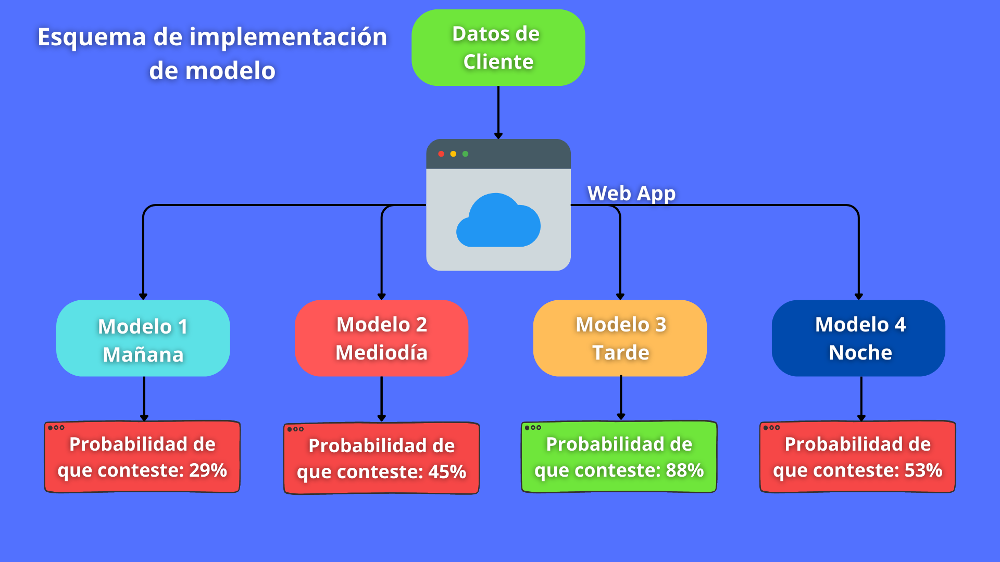